In this project I will use data from (https://www.kaggle.com/giripujar/hr-analytics).


I was interested in factors, which influence the decision whether to leave the place of work or not, so I've chosen such a dataset.

In [7]:
import numpy as np # Needed libreries
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
df = pd.read_csv("HR_comma_sep.csv",sep =',') #loading data

In [9]:
df.shape # (number of objects, number of parameters)

(14999, 10)

In [10]:
df.columns # parameters

Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident', 'left',
       'promotion_last_5years', 'Department', 'salary'],
      dtype='object')

In [11]:
df.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Department,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.11,0.88,7,272,4,0,1,0,sales,medium
3,0.72,0.87,5,223,5,0,1,0,sales,low
4,0.37,0.52,2,159,3,0,1,0,sales,low


Here we are looking for missing values in data.

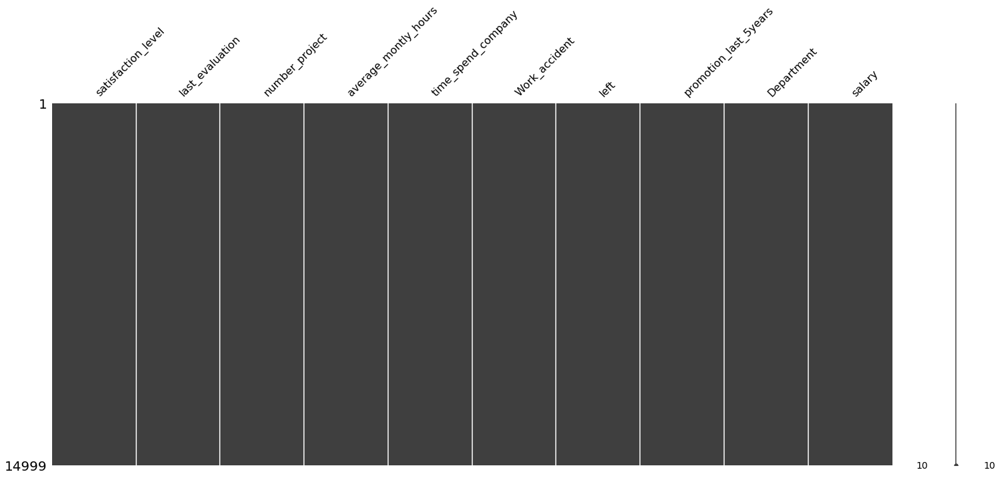

In [12]:
import missingno as msno
%matplotlib inline
msno.matrix(df)

Lets look at the structure of data.

In [13]:
df.describe()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years
count,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000
mean,0.612834,0.716102,3.803054,201.050337,3.498233,0.144610,0.238083,0.021268
std,0.248631,0.171169,1.232592,49.943099,1.460136,0.351719,0.425924,0.144281
min,0.090000,0.360000,2.000000,96.000000,2.000000,0.000000,0.000000,0.000000
25%,0.440000,0.560000,3.000000,156.000000,3.000000,0.000000,0.000000,0.000000
50%,0.640000,0.720000,4.000000,200.000000,3.000000,0.000000,0.000000,0.000000
75%,0.820000,0.870000,5.000000,245.000000,4.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,7.000000,310.000000,10.000000,1.000000,1.000000,1.000000


In [14]:
df['salary'].replace(['low', 'medium', 'high'], [0, 1, 2], inplace = True)

 There are no suspicious places in data, but we can also check the graphs. Just to be sure.

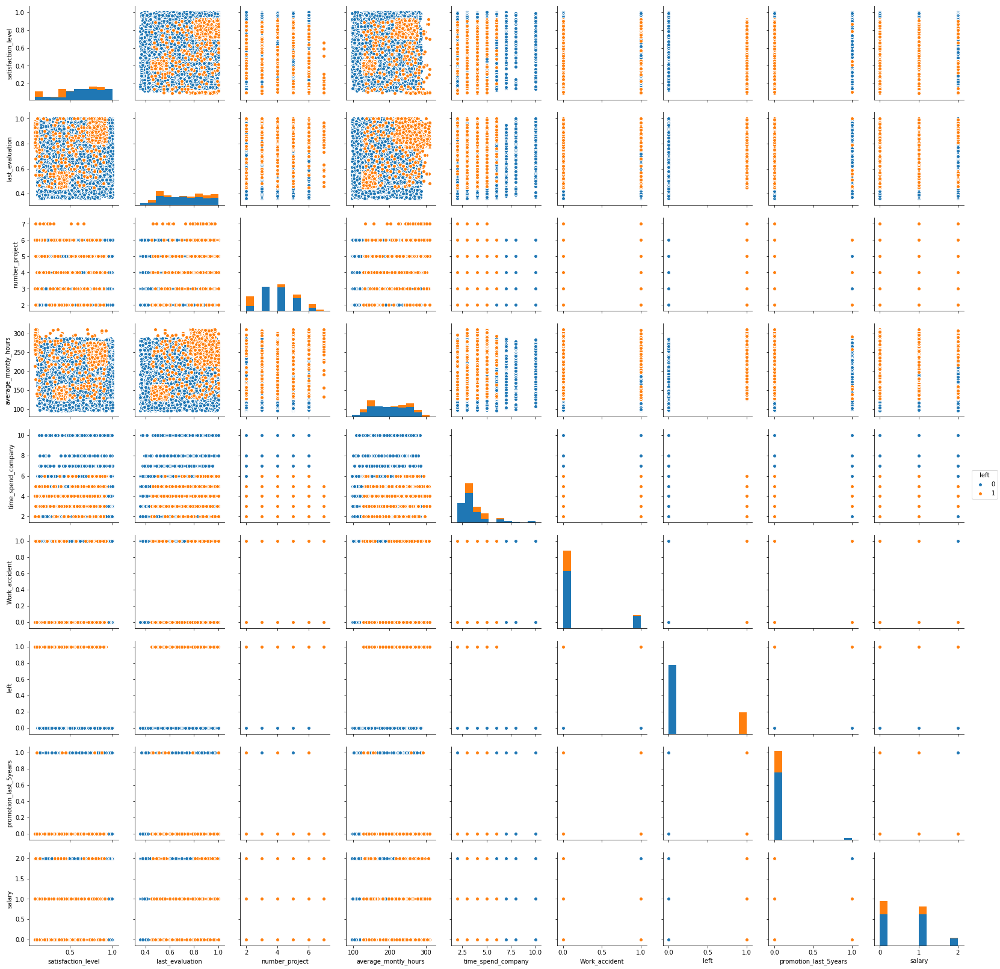

In [15]:
sns.pairplot(df, hue="left")

I will create data frame, where categorical variables will become dummy-variables.

In [16]:
dum_df = pd.get_dummies(df)

In [17]:
dum_df.shape

(14999, 19)

And correlation matrix of parameters:

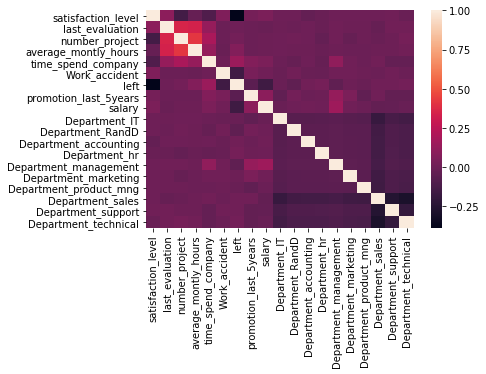

In [18]:
corr = dum_df.corr(method = 'pearson')
sns.heatmap(corr)

Parameter satisfaction_level is correlated with left, but not much.

In order to find the most important parameters, I will use different functions in libraries.(ExtraTreesClassifier и xgboost)

In [19]:
X = dum_df.drop('left',1)
y = dum_df['left']

In [20]:
from sklearn import metrics
from sklearn.ensemble import ExtraTreesClassifier
import xgboost as xgb

In [21]:
model = ExtraTreesClassifier()
col = list(dum_df.columns)
del col[col.index('left')]
model.fit(X, y)
importance_df = pd.DataFrame({'params':col, 'importance_ETC': model.feature_importances_})
importance_df = importance_df.sort_values(['importance_ETC'], ascending=0) 
#  importance_df keeps importance of parameters according to ExtraTreesClassifier

In [22]:
gbm = xgb.XGBClassifier(n_estimators=300, seed=42) 
# n_estimators is pretty high to take into account all parameters
gbm.fit(X, y)
bst = gbm.get_booster()
imps = bst.get_fscore()

In [23]:
import operator
sorted_imps = sorted(imps.items(), key=operator.itemgetter(1), reverse = True)
data_imps = pd.DataFrame.from_dict(sorted_imps)
data_imps.columns = ['params', 'raw_importance']
# raw_importance - initial parameter, which means importance of parameters, let us make our parameter importance_XGB, 
# which will mean the share of importance
s = sum(data_imps.raw_importance) 
a = []
for i in range(len(data_imps)):
    data_imps['params'] = data_imps.replace('f'+str(i), col[i])
    a.append(int(data_imps['raw_importance'][i])/s)
data_imps['importance_XGB'] = a
# In data_imps there is information about importance of parameters according to xgboost

Lets plot the picture.

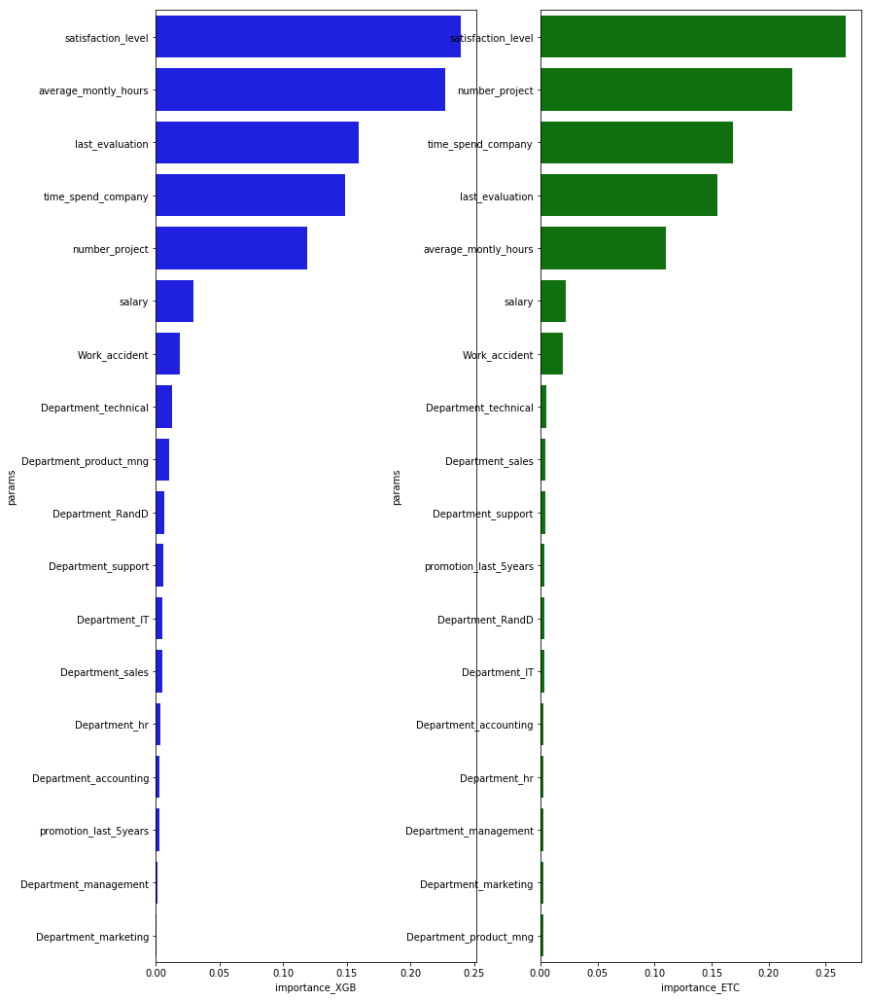

In [24]:
fig, (ax1, ax2) = plt.subplots(figsize=(13, 18),ncols=2)

sns.barplot(x="importance_XGB", y="params", data=data_imps, color="b", ax = ax1 )
sns.barplot(x="importance_ETC", y="params", data=importance_df, color="g", ax = ax2)

And get red of parameters which are definetely do not mean anything.

In [25]:
noise = []
n1 = list(importance_df['params'][len(importance_df)-8:len(importance_df)])
n2 = list(data_imps['params'][len(data_imps)-8:len(data_imps)])
for i in range(len(n1)):
    if n1[i] in n2:
        noise.append(n1[i])
noise = list(set(noise))

In [74]:
print('unsignificant parameters')
noise

unsignificant parameters


['promotion_last_5years',
 'Department_accounting',
 'Department_marketing',
 'Department_IT',
 'Department_hr',
 'Department_management']

In [27]:
dum_df.drop(noise,inplace=True,axis=1)

In [75]:
print('parameters which we have now')
dum_df.columns

parameters which we have now


Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident', 'left',
       'salary', 'Department_RandD', 'Department_product_mng',
       'Department_sales', 'Department_support', 'Department_technical'],
      dtype='object')


In the picture below there is a relation between the most imoortant parameters and valoue of the parameter left.
We can use it on order to fing clusters.

/Users/macbook/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: 'pandas.tools.plotting.radviz' is deprecated, import 'pandas.plotting.radviz' instead.
  This is separate from the ipykernel package so we can avoid doing imports until


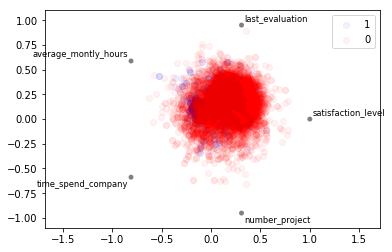

In [29]:
from pandas.tools.plotting import radviz
radviz(df[['satisfaction_level', 'last_evaluation', 'average_montly_hours', 'time_spend_company','number_project' ,'left']], 
       'left', alpha = 0.05, color = ['b','r'])

It's pretty hard to find clusters here, but probably it is just not the best picture (at least, it looks cool.)
So lets try to use clusterization.

# Кластеризация

In [30]:
from sklearn.cluster import KMeans

Firstly I will use k-means. The number of clusters is not known for us, so I will make different cases.

Поскольку заранее оптимальное количество кластеров неизвестно, то создадим несколько разных вариантов.

In [31]:
kmeans2 = KMeans(n_clusters=2, random_state=42).fit_predict(X)
kmeans4 = KMeans(n_clusters=4, random_state=42).fit_predict(X)
kmeans7 = KMeans(n_clusters=7, random_state=42).fit_predict(X)
kmeans9 = KMeans(n_clusters=9, random_state=42).fit_predict(X)
kmeans15 = KMeans(n_clusters=15, random_state=42).fit_predict(X)
kmeans20 = KMeans(n_clusters=20, random_state=42).fit_predict(X)

In [32]:
km_df = pd.DataFrame({'kmeans2':kmeans2, 'kmeans4':kmeans4, 'kmeans7':kmeans7, 
                      'kmeans9':kmeans9, 'kmeans15':kmeans15, 'kmeans20':kmeans20,'left':y})

So, we have different cases with 2, 4, 7, 9, 15 and 20 clusters. 

In [33]:
km_df.head()

,kmeans15,kmeans2,kmeans20,kmeans4,kmeans7,kmeans9,left
0,4,1,12,1,6,3,1
1,3,0,17,2,3,0,1
2,7,0,9,2,3,0,1
3,12,0,3,0,1,8,1
4,4,1,6,1,6,3,1


Lets plot histograms for each case where we can see the results of clusterisation.


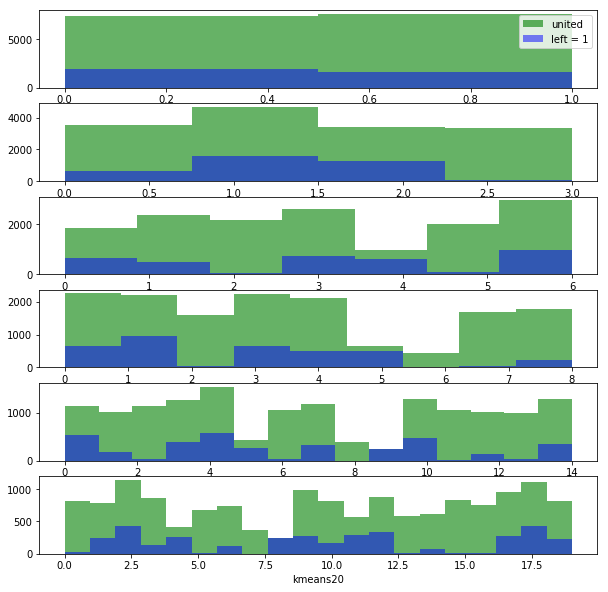

In [34]:
f, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(6, figsize=(10, 10))
ax1 = sns.distplot(km_df.kmeans2, bins=2, hist_kws={"alpha": 0.6, 'color':'g'},
                   kde=False, rug=False, label="united", ax= ax1)
ax1 = sns.distplot(km_df[km_df['left'] == 1].kmeans2, bins=2, hist_kws={"alpha": 0.5, 'color':'b'}, 
                   kde=False, rug=False,  label="left = 1", ax= ax1)
ax1.legend()


ax2 = sns.distplot(km_df.kmeans4, bins=4, hist_kws={"alpha": 0.6, 'color':'g'},
                   kde=False, rug=False, ax= ax2)
ax2 = sns.distplot(km_df[km_df['left'] == 1].kmeans4, bins=4, hist_kws={"alpha": 0.5, 'color':'b'}, 
                   kde=False, rug=False,  label="left = 1", ax= ax2)


ax3 = sns.distplot(km_df.kmeans7, bins=7, hist_kws={"alpha": 0.6, 'color':'g'},
                   kde=False, rug=False, ax= ax3)
ax3 = sns.distplot(km_df[km_df['left'] == 1].kmeans7, bins=7, hist_kws={"alpha": 0.5, 'color':'b'}, 
                   kde=False, rug=False,  label="left = 1", ax= ax3)


ax4 = sns.distplot(km_df.kmeans9, bins=9, hist_kws={"alpha": 0.6, 'color':'g'},
                   kde=False, rug=False, ax= ax4)
ax4 = sns.distplot(km_df[km_df['left'] == 1].kmeans9, bins=9, hist_kws={"alpha": 0.5, 'color':'b'}, 
                   kde=False, rug=False,  label="left = 1", ax= ax4)


ax5 = sns.distplot(km_df.kmeans15, bins=15, hist_kws={"alpha": 0.6, 'color':'g'},
                   kde=False, rug=False, ax= ax5)
ax5 = sns.distplot(km_df[km_df['left'] == 1].kmeans15, bins=15, hist_kws={"alpha": 0.5, 'color':'b'}, 
                   kde=False, rug=False,  label="left = 1", ax= ax5)


ax6 = sns.distplot(km_df.kmeans20, bins=20, hist_kws={"alpha": 0.6, 'color':'g'},
                   kde=False, rug=False, ax= ax6)
ax6 = sns.distplot(km_df[km_df['left'] == 1].kmeans20, bins=20, hist_kws={"alpha": 0.5, 'color':'b'}, 
                   kde=False, rug=False,  label="left = 1", ax= ax6)

Some clusters well divide objects on the basis of "left". Objects with "left" = 0 are better defined, but in the last two variants there are one cluster (about 200 in size), which classify objects with "left = 1" well.

However, we should not add them as an additional parameter, since in the future I would like to look at how the source data influences and the clusters themselves are still not very informative.

We divide the sample into a training and testing.

In [35]:
from sklearn.cross_validation import train_test_split

/Users/macbook/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [36]:
train, test = train_test_split(dum_df, test_size = 0.3, random_state =42)

In [37]:
X_train = train.drop('left',1)
y_train = train['left']
X_test = test.drop('left',1)
y_test = test['left']

Let's try to look at some classification algorithms. We will use roc_auc_score as a quality metric.

# Random Forest

In [43]:
from sklearn.ensemble import RandomForestClassifier

In [44]:
from sklearn.metrics import roc_auc_score

the highest accuracy:  0.9783107507967747 The optimal depth 23


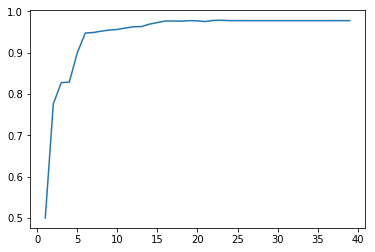

In [78]:
test_acc = []
d_RF_est = []
for i in np.arange(1,40,1):
    RFC = RandomForestClassifier( n_estimators = n_est_optRFC, max_depth = i, random_state = 42)
    RFC.fit(X_train, y_train)
    y_pred_RFC_test = RFC.predict(X_test)
    d_RF_est.append(i)
    test_acc.append(roc_auc_score(y_test, y_pred_RFC_test))
d_est_optRFC = d_RF_est[test_acc.index(max(test_acc))]
print('the highest accuracy: ', max(test_acc), 
      'The optimal depth', d_est_optRFC )

plt.plot(d_RF_est, test_acc)

the highest accuracy:  0.9773779149758791 The optimal number of trees 19


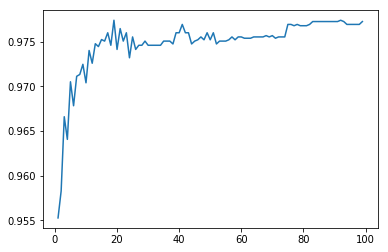

In [77]:
test_acc = []
n_RF_est = []
for i in np.arange(1,100,1):
    RFC = RandomForestClassifier( n_estimators = i, random_state = 42)
    RFC.fit(X_train, y_train)
    y_pred_RFC_test = RFC.predict(X_test) 
# We can also use predict_proba (the probability of belonging to a class), but it is more interesting to try to determine the class itself.
    n_RF_est.append(i)
    test_acc.append(roc_auc_score(y_test, y_pred_RFC_test))
n_est_optRFC = n_RF_est[test_acc.index(max(test_acc))]
print('the highest accuracy: ', max(test_acc), 
      'The optimal number of trees', n_est_optRFC )
plt.plot(n_RF_est, test_acc)

In [47]:
RFC = RandomForestClassifier( n_estimators = n_est_optRFC, max_depth = d_est_optRFC, random_state = 42)
RFC.fit(X_train, y_train)
y_pred_RFC_test = RFC.predict(X_test)

# Decision Trees

First, we artificially limit the maximum depth (losing some accuracy), however, it is possible to evaluate the most interesting thing - the decision graph

In [53]:
from sklearn.tree import DecisionTreeClassifier

In [54]:
import pydotplus

In [55]:
DTC = DecisionTreeClassifier(max_depth = 3, random_state=42)
DTC.fit(X_train, y_train)
y_pred_DTC_test = DTC.predict(X_test)
roc_auc_score(y_test, y_pred_DTC_test)

0.9368153398700778

In [56]:
from IPython.display import Image
from sklearn.tree import export_graphviz

In [57]:
dot_data = export_graphviz(DTC, out_file=None, 
                           feature_names= X_train.columns,
                           class_names = ['0','1'],
                           filled=True, rounded=True,  
                           special_characters=True)

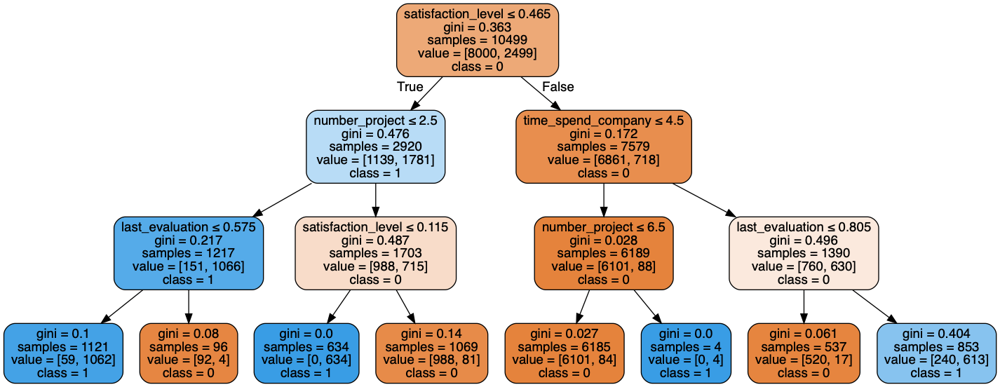

In [58]:
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

And build a model without any restrictions.

In [59]:
DTC = DecisionTreeClassifier(random_state=42)
DTC.fit(X_train, y_train)
y_pred_DTC_test = DTC.predict(X_test)
roc_auc_score(y_test, y_pred_DTC_test)

0.9695881372019715

The accuracy became higher.

In [60]:
dot_data = export_graphviz(DTC, out_file=None, 
                         feature_names= X_train.columns,
                         filled=True, rounded=True,  
                         special_characters=True)

In [61]:
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

But the graph looks scary and we shouldn't look at it.

# Другие методы

Now we will try to predict the result by several classifiers, using their standard parameters, then to try using simple ensembles (http://mlwave.com/kaggle-ensembling-guide/) and look at the resulting accuracy.

kNN

In [62]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
y_pred_KNN_test = knn.predict(X_test)
roc_auc_score(y_test, y_pred_KNN_test)

0.9211253026001845

SVM 

In [63]:
from sklearn.svm import SVC
svm = SVC()
svm.fit(X_train, y_train)
y_pred_SVCl_test = svm.predict(X_test)
roc_auc_score(y_test, y_pred_SVCl_test)

0.9348342883017817

LogisticRegression

In [64]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(X_train, y_train)
y_pred_LR_test = lr.predict(X_test)
roc_auc_score(y_test, y_pred_LR_test)

0.6355267855587872

Xgboost

In [65]:
xgb = xgb.XGBClassifier()
xgb.fit(X_train, y_train)
y_pred_XGB_test = xgb.predict(X_test)
roc_auc_score(y_test, y_pred_XGB_test)

/Users/macbook/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


0.9501765530573503

In [66]:
res_df = pd.DataFrame({'RF': y_pred_RFC_test, 'DT': y_pred_DTC_test , 'KNN': y_pred_KNN_test, 
                   'SVC': y_pred_SVCl_test, 'LR': y_pred_LR_test, 'XGB':y_pred_XGB_test })

In [67]:
res_df.head()

,DT,KNN,LR,RF,SVC,XGB
0,0,0,0,0,0,0
1,0,0,0,0,0,0
2,0,0,0,0,0,0
3,1,1,0,1,1,1
4,0,0,0,0,0,0


Let's see how the results correlate with each other.

Graphically:

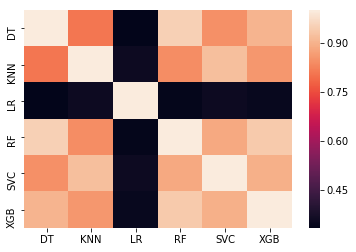

In [68]:
corr = res_df.corr(method = 'pearson')
sns.heatmap(corr)

And in the table.

In [69]:
corr

,DT,KNN,LR,RF,SVC,XGB
DT,1.000000,0.807673,0.332857,0.951640,0.846544,0.904265
KNN,0.807673,1.000000,0.353801,0.842166,0.923729,0.858491
LR,0.332857,0.353801,1.000000,0.338082,0.355617,0.348288
RF,0.951640,0.842166,0.338082,1.000000,0.885866,0.941409
SVC,0.846544,0.923729,0.355617,0.885866,1.000000,0.897408
XGB,0.904265,0.858491,0.348288,0.941409,0.897408,1.000000


As you can see, the data (except for logistic regression) are quite strongly correlated. This is not very good. Therefore, we delete the RF parameter (the most accurate parameter and the only one in which the hyperparameters were selected). It will be interesting to compare the results.

In [70]:
res_df.drop(['RF'],inplace=True,axis=1)

In [71]:
summ = res_df.sum(axis = 1)
res_df['ensemble'] = (summ > 2.5)*1
roc_auc_score(y_test, res_df.ensemble)

0.9507583508943033

The result is worse than the result of the Random forest, but it is better than anything else.

Let's try to leave the least correlated parameters.

In [72]:
res_df = pd.DataFrame({'RF': y_pred_RFC_test, 'DT': y_pred_DTC_test , 'KNN': y_pred_KNN_test, 
                   'SVC': y_pred_SVCl_test, 'LR': y_pred_LR_test, 'XGB':y_pred_XGB_test })
res_df = res_df[['DT', 'KNN', 'LR']]

In [73]:
summ = res_df.sum(axis = 1)
res_df['ensemble'] = (summ > 1.5)*1
roc_auc_score(y_test, res_df.ensemble)

0.9420694804855536

The situation is similar, although the result of the decision tree classifier has even deteriorated. Conclusion: simple ensembles do not solve the problem completely, the algorithms will still have to be set up :) and in the ensemble itself - to select weights or use more complex algorithms.